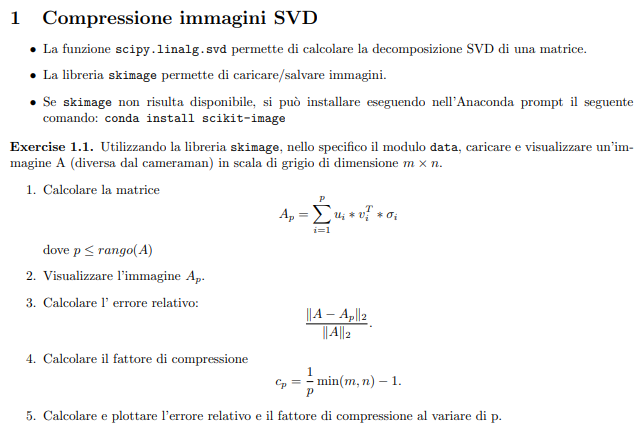

<class 'numpy.ndarray'>
(300, 451)


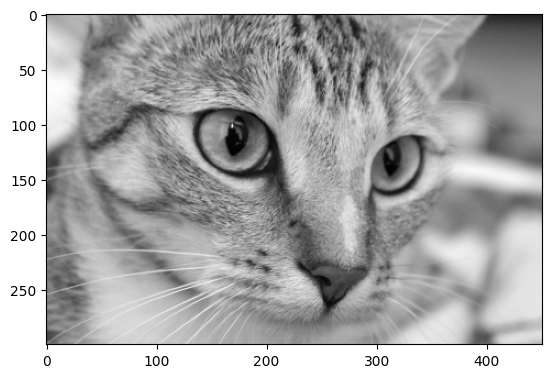

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.linalg
from skimage import data

from skimage.color import rgb2gray

# help(data)

A = rgb2gray(data.cat())

# A = data...
# A = imread...


print(type(A))
print(A.shape)
plt.imshow(A, cmap='gray')
plt.show()

In [2]:
U, s, Vh = scipy.linalg.svd(A)

print('Shape of U:', U.shape)
print('Shape of s:', s.shape)
print('Shape of V:', Vh.T.shape)

Shape of U: (300, 300)
Shape of s: (300,)
Shape of V: (451, 451)


[[0.57557565 0.57118212 0.5661464  ... 0.17015    0.17142979 0.1741203 ]
 [0.58479853 0.58010911 0.57502011 ... 0.16632473 0.16755338 0.17031536]
 [0.59510264 0.59029653 0.58530372 ... 0.16541963 0.16658728 0.16947819]
 ...
 [0.3541353  0.3601012  0.36956208 ... 0.61827072 0.6179961  0.61757108]
 [0.36657393 0.3726518  0.3821622  ... 0.61212103 0.61191369 0.61153133]
 [0.36279241 0.36897104 0.37854731 ... 0.60588462 0.60581145 0.60552529]]


L'errore relativo della ricostruzione di A è 0.032569869265972336
Il fattore di compressione è c= 29.0


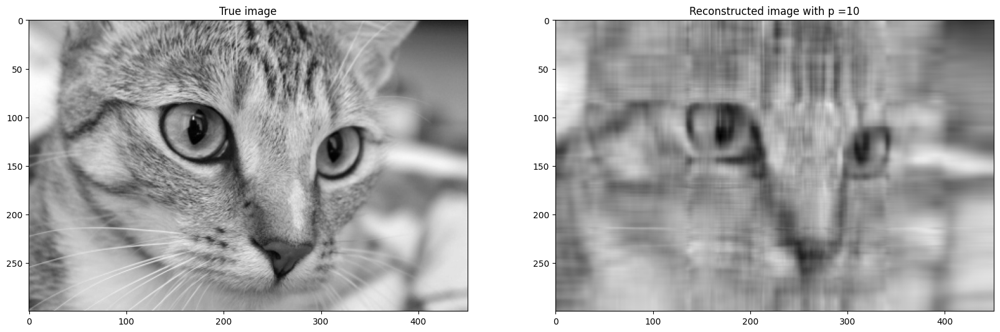

In [3]:
A_p = np.zeros(A.shape)
p_max = 10 # min(A.shape)

for i in range(p_max):
  ui = U[:, i]
  vi = Vh[i, :]

  A_p +=s[i] * np.outer(ui, vi.T)

print(A_p)
err_rel = np.linalg.norm(A - A_p,2)/np.linalg.norm(A,2)
c = 1/p_max*min(A.shape) - 1

print('\n')
print('L\'errore relativo della ricostruzione di A è', err_rel)
print('Il fattore di compressione è c=', c)


plt.figure(figsize=(20, 10))

fig1 = plt.subplot(1, 2, 1)
fig1.imshow(A, cmap='gray')
plt.title('True image')

fig2 = plt.subplot(1, 2, 2)
fig2.imshow(A_p, cmap='gray')
plt.title('Reconstructed image with p =' + str(p_max))

plt.show()

[[0.51458865 0.51462019 0.50414169 ... 0.13287161 0.13609989 0.13877488]
 [0.50767811 0.50645842 0.49616155 ... 0.12877765 0.13240874 0.13569741]
 [0.51115034 0.5075851  0.49688744 ... 0.13018101 0.13375692 0.1367465 ]
 ...
 [0.28793484 0.29342934 0.30560818 ... 0.61269465 0.6127649  0.61440901]
 [0.3118291  0.31847859 0.33090472 ... 0.60327492 0.60327324 0.60504581]
 [0.30264831 0.30995985 0.32292301 ... 0.59372048 0.59397604 0.59600874]]


L'errore relativo della ricostruzione di A è 0.007518129446814761
Il fattore di compressione è c= 5.0


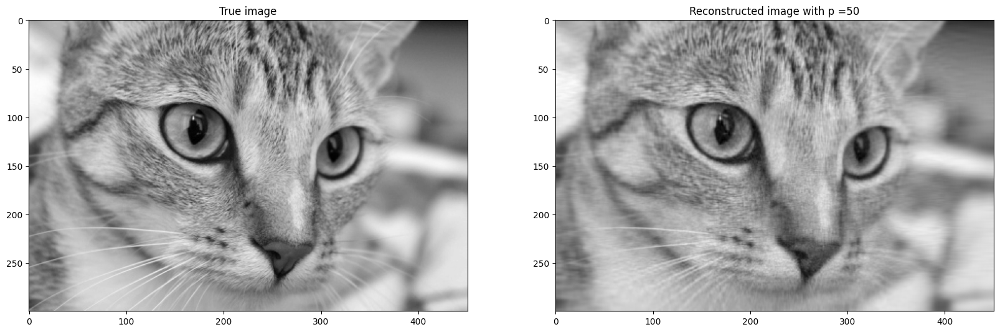

In [4]:
A_p = np.zeros(A.shape)
p_max = 50 # min(A.shape)

for i in range(p_max):
  ui = U[:, i]
  vi = Vh[i, :]

  A_p +=s[i] * np.outer(ui, vi.T)

print(A_p)
err_rel = np.linalg.norm(A - A_p,2)/np.linalg.norm(A,2)
c = 1/p_max*min(A.shape) - 1

print('\n')
print('L\'errore relativo della ricostruzione di A è', err_rel)
print('Il fattore di compressione è c=', c)


plt.figure(figsize=(20, 10))

fig1 = plt.subplot(1, 2, 1)
fig1.imshow(A, cmap='gray')
plt.title('True image')

fig2 = plt.subplot(1, 2, 2)
fig2.imshow(A_p, cmap='gray')
plt.title('Reconstructed image with p =' + str(p_max))

plt.show()

[[0.48891808 0.4890698  0.48068658 ... 0.12240164 0.12257277 0.12400403]
 [0.49793795 0.49554541 0.48376279 ... 0.11980248 0.1206909  0.12425476]
 [0.50715472 0.50567669 0.49700174 ... 0.12545647 0.12791491 0.13089529]
 ...
 [0.29718039 0.31617818 0.34973946 ... 0.58958701 0.5893409  0.59171927]
 [0.38439949 0.38964033 0.39613794 ... 0.57355987 0.57225412 0.57526161]
 [0.38211863 0.38110703 0.38278219 ... 0.55704007 0.55563417 0.55794448]]


L'errore relativo della ricostruzione di A è 0.0019249720144791614
Il fattore di compressione è c= 1.0


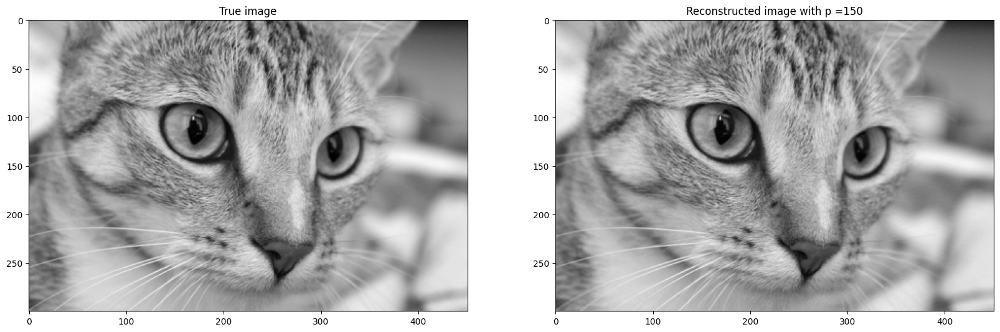

In [5]:
A_p = np.zeros(A.shape)
p_max = 150 # min(A.shape)

for i in range(p_max):
  ui = U[:, i]
  vi = Vh[i, :]

  A_p +=s[i] * np.outer(ui, vi.T)

print(A_p)
err_rel = np.linalg.norm(A - A_p,2)/np.linalg.norm(A,2)
c = 1/p_max*min(A.shape) - 1

print('\n')
print('L\'errore relativo della ricostruzione di A è', err_rel)
print('Il fattore di compressione è c=', c)


plt.figure(figsize=(20, 10))

fig1 = plt.subplot(1, 2, 1)
fig1.imshow(A, cmap='gray')
plt.title('True image')

fig2 = plt.subplot(1, 2, 2)
fig2.imshow(A_p, cmap='gray')
plt.title('Reconstructed image with p =' + str(p_max))

plt.show()

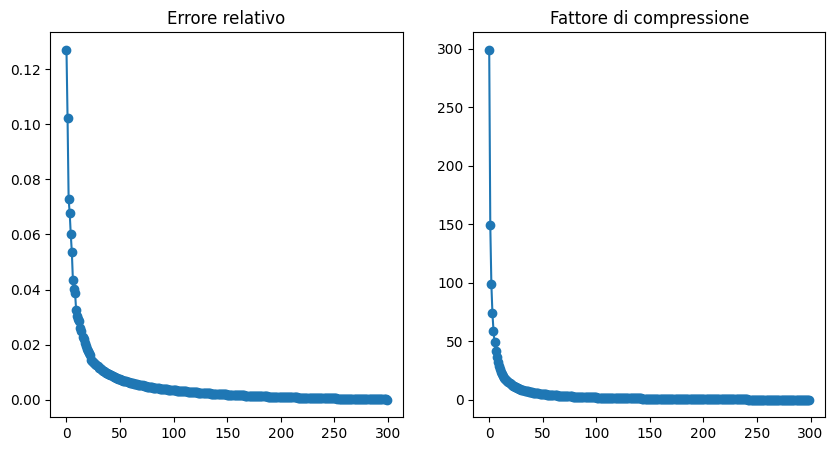

In [6]:
# al variare di p
p_max = min(A.shape)
A_p = np.zeros(A.shape)
err_rel = np.zeros((p_max))
c = np.zeros((p_max))

for i in range(p_max):
  ui = U[:, i]
  vi = Vh[i, :]

  A_p +=s[i] * np.outer(ui, vi.T)

  err_rel[i] = np.linalg.norm(A - A_p,2)/np.linalg.norm(A,2)
  c[i] = 1/(i+1)*min(A.shape) - 1

plt.figure(figsize=(10, 5))

fig1 = plt.subplot(1, 2, 1)
fig1.plot(err_rel, 'o-')
plt.title('Errore relativo')

fig2 = plt.subplot(1, 2, 2)
fig2.plot(c, 'o-')
plt.title('Fattore di compressione')

plt.show()

image.png

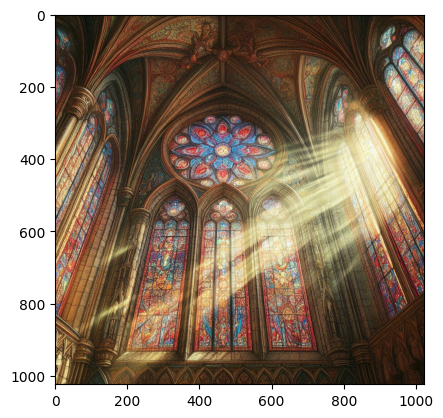

In [7]:
#from google.colab import drive
from skimage.io import imread

#drive.mount('/gdrive')
B = imread("./cathedral.jpeg")
plt.imshow(B)
plt.show()

In [8]:
def iterate_SVD(B, p_max):
  B_p = np.zeros(B.shape)
  for z in range(3):
    slice_B = B[:,:,z]
    slice_B_p = B_p[:,:,z]
    U, s, Vh = scipy.linalg.svd(slice_B)
    print('Shape of U:', U.shape)
    print('Shape of s:', s.shape)
    print('Shape of V:', Vh.T.shape)

    for i in range(p_max):
      ui = U[:, i]
      vi = Vh[i, :]

      slice_B_p += s[i] * np.outer(ui, vi.T)

    err_rel = np.linalg.norm(slice_B - slice_B_p,2)/np.linalg.norm(slice_B,2)
    c = 1/p_max*min(slice_B.shape) - 1

    print('\n')
    print('L\'errore relativo della ricostruzione di B è', err_rel)
    print('Il fattore di compressione è c=', c)
    B_p[:,:,z] = slice_B_p
  return B_p

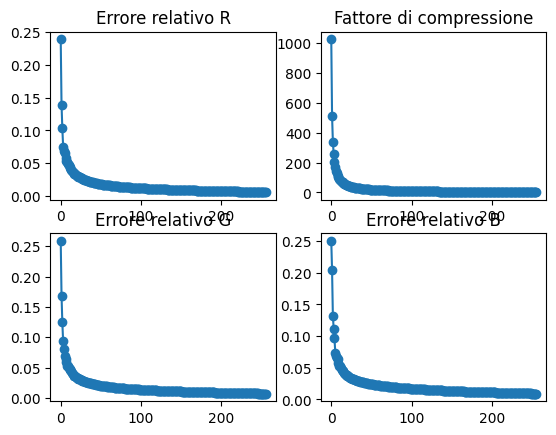

In [9]:
# al variare di p
p_max = 256 #min(B[:,:,0].shape)
B_p = np.zeros(B.shape)
err_rel = np.zeros((p_max, 3))
c = np.zeros((p_max))

for z in range(3):
    slice_B = B[:,:,z]
    slice_B_p = B_p[:,:,z]
    U, s, Vh = scipy.linalg.svd(slice_B)

    for i in range(p_max):
        ui = U[:, i]
        vi = Vh[i, :]

        slice_B_p += s[i] * np.outer(ui, vi.T)

        err_rel[i][z] = (np.linalg.norm(slice_B - slice_B_p,2)/np.linalg.norm(slice_B,2))
        c[i] = 1/(i+1)*min(slice_B.shape) - 1

    B_p[:,:,z] = slice_B_p

fig1 = plt.subplot(2, 2, 1)
fig1.plot(err_rel[:,0], 'o-')
plt.title('Errore relativo R')

fig3 = plt.subplot(2, 2, 3)
fig3.plot(err_rel[:,1], 'o-')
plt.title('Errore relativo G')

fig4 = plt.subplot(2, 2, 4)
fig4.plot(err_rel[:,2], 'o-')
plt.title('Errore relativo B')

fig2 = plt.subplot(2, 2, 2)
fig2.plot(c, 'o-')
plt.title('Fattore di compressione')

plt.show()

Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


L'errore relativo della ricostruzione di B è 0.037360862343479705
Il fattore di compressione è c= 63.0
Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


L'errore relativo della ricostruzione di B è 0.03923106744160623
Il fattore di compressione è c= 63.0
Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).




L'errore relativo della ricostruzione di B è 0.044351934180363
Il fattore di compressione è c= 63.0


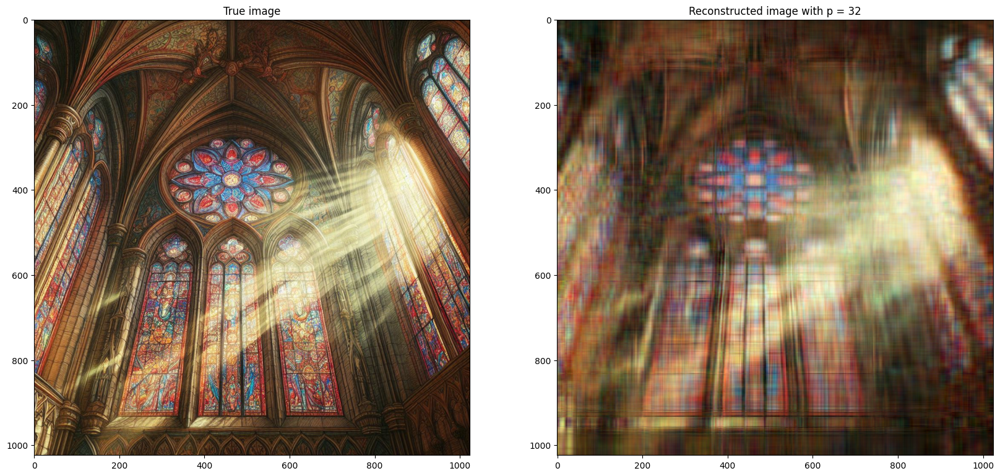

In [10]:
B_p = iterate_SVD(B, 16)

plt.figure(figsize=(20, 10))

fig1 = plt.subplot(1, 2, 1)
fig1.imshow(B)
plt.title('True image')

fig2 = plt.subplot(1, 2, 2)
fig2.imshow(B_p.astype(np.int64))
plt.title('Reconstructed image with p = 32')

plt.show()

Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


L'errore relativo della ricostruzione di B è 0.015612279878462459
Il fattore di compressione è c= 15.0
Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


L'errore relativo della ricostruzione di B è 0.017974164394833715
Il fattore di compressione è c= 15.0
Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).




L'errore relativo della ricostruzione di B è 0.02157873712432318
Il fattore di compressione è c= 15.0


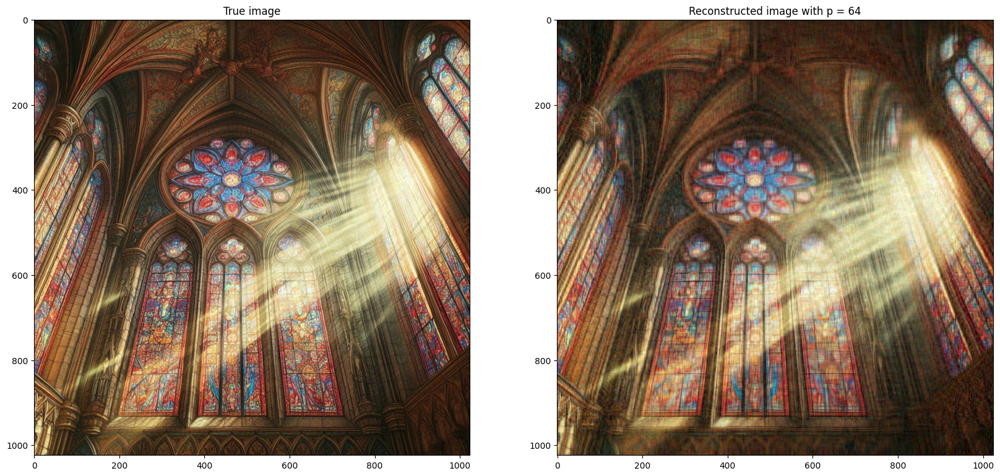

In [11]:
B_p = iterate_SVD(B, 64)

plt.figure(figsize=(20, 10))

fig1 = plt.subplot(1, 2, 1)
fig1.imshow(B)
plt.title('True image')

fig2 = plt.subplot(1, 2, 2)
fig2.imshow(B_p.astype(np.int64))
plt.title('Reconstructed image with p = 64')

plt.show()

Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


L'errore relativo della ricostruzione di B è 0.006038416854934847
Il fattore di compressione è c= 3.0
Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


L'errore relativo della ricostruzione di B è 0.007262418463453736
Il fattore di compressione è c= 3.0
Shape of U: (1024, 1024)
Shape of s: (1024,)
Shape of V: (1024, 1024)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).




L'errore relativo della ricostruzione di B è 0.00923825132377104
Il fattore di compressione è c= 3.0


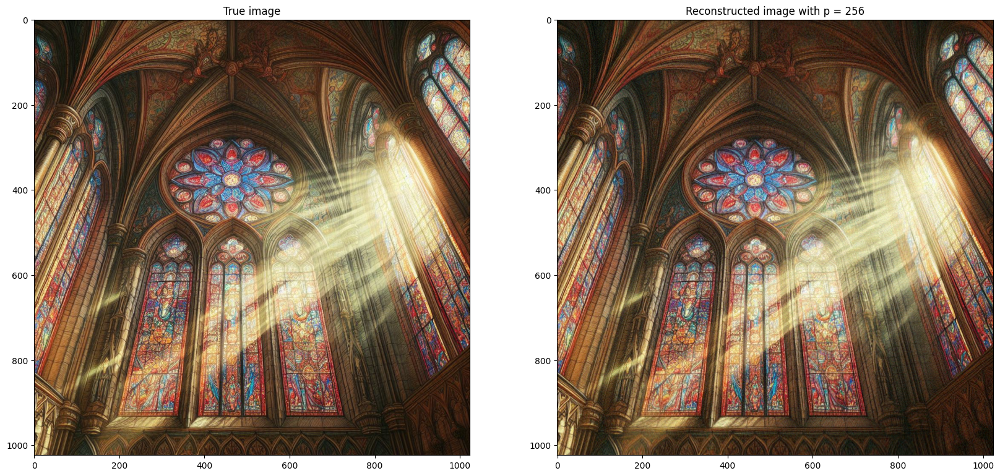

In [12]:
B_p = iterate_SVD(B, 256)

plt.figure(figsize=(20, 10))

fig1 = plt.subplot(1, 2, 1)
fig1.imshow(B)
plt.title('True image')

fig2 = plt.subplot(1, 2, 2)
fig2.imshow(B_p.astype(np.int64))
plt.title(f'Reconstructed image with p = 256')

plt.show()